In [1]:
from numpy import zeros
from numpy import ones
from numpy.random import randint
from keras.optimizers import Adam 
from keras.initializers import RandomNormal
from keras.models import Model
from keras.layers import Input, Conv2D, Conv2DTranspose, LeakyReLU, Activation, Concatenate, Dropout, BatchNormalization
import matplotlib.pyplot as plt
from keras.utils import plot_model
from PIL import Image
import os
import numpy as np
from sklearn.model_selection import train_test_split
import tensorflow as tf
import matplotlib.pyplot as plt

2024-06-11 09:04:16.360648: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-06-11 09:04:16.360779: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-06-11 09:04:16.489024: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


In [2]:
import os
import tensorflow as tf
from PIL import Image
import numpy as np
from tensorflow.keras.losses import BinaryCrossentropy

In [3]:
pip freeze > requirements.txt

Note: you may need to restart the kernel to use updated packages.


In [3]:
import os
import numpy as np
from PIL import Image
import tensorflow as tf

def preprocess_image(image_file, img_size):
    rgb_image = Image.open(image_file).resize((img_size, img_size))
    gray_image = rgb_image.convert('L').resize((img_size, img_size))
    
    rgb_img_array = np.array(rgb_image) / 255.0
    gray_img_array = np.array(gray_image) / 255.0
    gray_img_array = np.stack([gray_img_array, gray_img_array, gray_img_array], axis=-1)  # Repeat grayscale values to create 3 channels
    
    return gray_img_array, rgb_img_array

def data_generator(file_list, img_size):
    for image_file in file_list:
        gray_img_array, rgb_img_array = preprocess_image(image_file, img_size)
        yield gray_img_array, rgb_img_array

def prepare_dataset(file_list, img_size, batch_size):
    dataset = tf.data.Dataset.from_generator(
        lambda: data_generator(file_list, img_size),
        output_signature=(
            tf.TensorSpec(shape=(img_size, img_size, 3), dtype=tf.float32),
            tf.TensorSpec(shape=(img_size, img_size, 3), dtype=tf.float32)
        )
    )
    dataset = dataset.batch(batch_size).prefetch(buffer_size=tf.data.AUTOTUNE)
    return dataset

# Загрузка имен файлов
image_dir = '/kaggle/input/landscape-image-colorization/landscape Images/color'
img_size = 256
batch_size = 32

file_list = []
for root, dirs, files in os.walk(image_dir):
    for file in files:
        if file.endswith(('png', 'jpg', 'jpeg')):
            file_list.append(os.path.join(root, file))

# Разделение на тренировочные и валидационные данные
val_size = 10
val_file_list = file_list[:val_size]
train_file_list = file_list[val_size:]

# Создание тренировочного и валидационного наборов данных
train_dataset = prepare_dataset(train_file_list, img_size, batch_size)
val_dataset = prepare_dataset(val_file_list, img_size, batch_size)

# Проверка размеров
X_realA, X_realB = next(iter(train_dataset))
print("Shape of X_realA (train):", X_realA.shape) 
print("Shape of X_realB (train):", X_realB.shape)

X_valA, X_valB = next(iter(val_dataset))
print("Shape of X_realA (val):", X_valA.shape) 
print("Shape of X_realB (val):", X_valB.shape)


Shape of X_realA (train): (32, 256, 256, 3)
Shape of X_realB (train): (32, 256, 256, 3)
Shape of X_realA (val): (10, 256, 256, 3)
Shape of X_realB (val): (10, 256, 256, 3)


In [4]:
example_gray, example_color = next(iter(train_dataset))

In [5]:
def plot_images(a = 4):
    
    for i in range(a):
        plt.figure(figsize = (10,10))
        plt.subplot(121)
        plt.title('color')
        plt.imshow(example_color[i] )

        plt.subplot(122)
        plt.title('gray')
        plt.imshow(example_gray[i])
        plt.show()

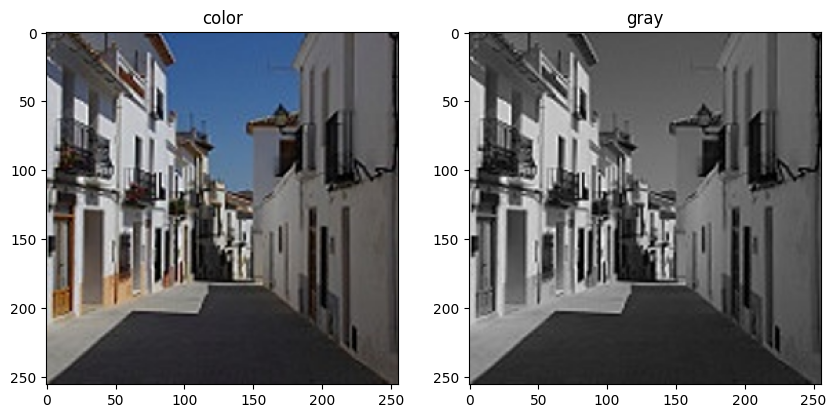

In [6]:
plot_images(1)


In [7]:

def define_discriminator(image_shape = (256, 256, 3)):
    init = RandomNormal(stddev=0.02)
    in_src_image = Input(shape=image_shape, name = 'input_image')
    in_target_image = Input(shape=image_shape, name='target_image')
    merged = Concatenate()([in_src_image, in_target_image])

    d = Conv2D(64, (4,4), strides = (2,2), padding='same', kernel_initializer=init)(merged)
    d = LeakyReLU(negative_slope=0.2)(d)

    d = Conv2D(128, (4,4), strides = (2,2), padding='same', kernel_initializer=init)(d)
    d = BatchNormalization()(d)
    d = LeakyReLU(negative_slope=0.2)(d)

    d = Conv2D(256, (4,4), strides = (2,2), padding='same', kernel_initializer=init)(d)
    d = BatchNormalization()(d)
    d = LeakyReLU(negative_slope=0.2)(d)

    d = Conv2D(512, (4,4), strides = (2,2), padding='same', kernel_initializer=init)(d)
    d = BatchNormalization()(d)
    d = LeakyReLU(negative_slope=0.2)(d)

    d = Conv2D(1, (4, 4), padding='same', kernel_initializer = init)(d)
    patch_out = Activation('sigmoid')(d)

    model = Model([in_src_image, in_target_image], patch_out)
    return model


    



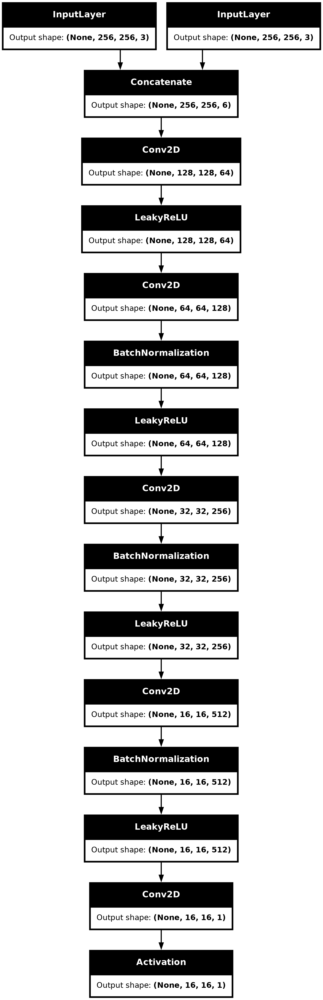

In [8]:

disc_model = define_discriminator((256, 256, 3))
plot_model(disc_model, to_file = 'disc_model.png', show_shapes = True)

In [9]:
def define_encoder_block(layer_in, n_filters, batchnorm=True):
        init = RandomNormal(stddev=0.02)

        g = Conv2D(n_filters, (4, 4), strides =(2, 2), padding = 'same', kernel_initializer = init)(layer_in)

        if batchnorm:
            g = BatchNormalization()(g, training = True)

        g = LeakyReLU(negative_slope=0.2)(g)
        return g

def decoder_block(layer_in, skip_in, n_filters, dropout = True):
        init = RandomNormal(stddev=0.02)

        g = Conv2DTranspose(n_filters, (4, 4), strides = (2, 2), padding = 'same', kernel_initializer = init)(layer_in)
        g = BatchNormalization()(g, training = True)
        if dropout:
            g = Dropout(0.5)(g, training=True)
        g = Concatenate()([g, skip_in])

        g = Activation('relu')(g)
        return g

In [10]:

def define_generator(image_shape=(256, 256, 3)):

    init = RandomNormal(stddev=0.02)

    in_image = Input(shape = image_shape)

    e1 = define_encoder_block(in_image, 64, batchnorm=False)
    e2 = define_encoder_block(e1, 128)
    e3 = define_encoder_block(e2, 256)
    e4 = define_encoder_block(e3, 512)
    e5 = define_encoder_block(e4, 512)
    e6 = define_encoder_block(e5, 512)
    e7 = define_encoder_block(e6, 512)

    b = Conv2D(512, (4,4), strides = (2, 2), padding = 'same', kernel_initializer = init)(e7)
    b = Activation('relu')(b)

    d1 = decoder_block(b, e7, 512)
    d2 = decoder_block(d1, e6, 512)
    d3 = decoder_block(d2, e5, 512)
    d4 = decoder_block(d3, e4, 512, dropout = False)
    d5 = decoder_block(d4, e3, 256, dropout = False)
    d6 = decoder_block(d5, e2, 128, dropout = False)
    d7 = decoder_block(d6, e1, 64, dropout = False)

    g = Conv2DTranspose(3, (4, 4), strides = (2, 2), padding = 'same', kernel_initializer = init)(d7)
    out_image = Activation('tanh')(g)

    model = Model(in_image, out_image)
    return model

In [11]:
gen_model = define_generator((256, 256, 3))
plot_model(gen_model, to_file = 'gen_model.png', show_shapes = True)

In [12]:

# def build_gan(generator, discriminator):
#     discriminator.trainable = False
#     input = tf.keras.Input(shape=(SIZE, SIZE, 1))
#     generated_image = generator(input)
#     validity = discriminator(generated_image)
#     gan = tf.keras.Model(inputs=input, outputs=[generated_image, validity])
#     gan.compile(loss=['mse', 'binary_crossentropy'], loss_weights=[0.9999, 0.0001], optimizer='adam')
#     gan.summary()
#     return gan

# gan = build_gan(define_generator, discriminator)


In [13]:
# SIZE = 256
# def define_gan(generator, discriminator):
#     discriminator.trainable = False
#     input = Input(shape=(SIZE, SIZE, 1))
#     generated_image = generator(input)
#     validity = discriminator(generated_image)
#     gan = Model(inputs=input, outputs=[generated_image, validity])
#     opt = Adam(learning_rate = 0.0002, beta_1 = 0.5, beta_2 = 0.999)
#     gan.compile(loss=['mse', 'binary_crossentropy'], optimizer = opt, loss_weights = [1,100])
#     gan.summary()
#     return gan
# def define_gan(generator, discriminator, image_shape):
#     discriminator.trainable = False
    
#     in_src = Input(shape=(image_shape[0], image_shape[1], 1))  # Черно-белое изображение
#     in_target = Input(shape=image_shape)  # Цветное изображение
    
#     gen_out = generator(in_src)  # Генератор производит цветное изображение
    
#     disc_out = discriminator([gen_out, in_target])  # Дискриминатор получает два цветных изображения
#     model = Model(inputs=in_src, outputs=[gen_out, disc_out])
    
#     opt = Adam(learning_rate=0.0002, beta_1=0.5, beta_2=0.999)
#     model.compile(loss=['mae', 'binary_crossentropy'], optimizer=opt, loss_weights=[1, 100])
    
#     return model

In [14]:

# import time

# def train_gan(generator, discriminator, gan, x_train, y_train, epochs=1000, batch_size=1):
#     batch_count = x_train.shape[0] // batch_size
#     d_loss_list = []  # Danh sách để lưu giá trị loss của discriminator
#     g_loss_list = []  # Danh sách để lưu giá trị loss của generator

#     for e in range(epochs):
#         start_time = time.time()  # Time start

#         for _ in range(batch_count):
#             idx = np.random.randint(0, x_train.shape[0], batch_size)
#             real_images = y_train[idx]
#             gray_images = x_train[idx]

#             fake_images = generator.predict(gray_images)

#             valid = np.ones((batch_size, 1))
#             fake = np.zeros((batch_size, 1))

#             d_loss_real = discriminator.train_on_batch(real_images, valid)
#             d_loss_fake = discriminator.train_on_batch(fake_images, fake)
#             d_loss = 0.5 * np.add(d_loss_real, d_loss_fake)

#             valid = np.ones((batch_size, 1))

#             g_loss = gan.train_on_batch(gray_images, [real_images, valid])

#         end_time = time.time()  # Time end
#         elapsed_time = end_time - start_time

#         print(f"Epoch {e}/{epochs}, D Loss: {d_loss[0]}, G Loss: {g_loss[0]}, Time: {elapsed_time:.2f} seconds")

#         # Save loss
#         d_loss_list.append(d_loss[0])
#         g_loss_list.append(g_loss[0])

#         # Compute remaining time
#         remaining_time = (epochs - e - 1) * elapsed_time
#         hours = int(remaining_time // 3600)
#         minutes = int((remaining_time % 3600) // 60)
#         print(f"Estimated time remaining: {hours} hours {minutes} minutes")

#     return d_loss_list, g_loss_list

In [15]:
# import time
# def train_gan(generator, discriminator, gan, train_dataset, epochs=1000, batch_size=1):
#     d_loss_list = []  # List to store discriminator loss values
#     g_loss_list = []  # List to store generator loss values
#     n_patch = d_model.output_shape[1]
#     for e in range(epochs):
#         start_time = time.time()  # Time start

#         for gray_images, real_images in train_dataset:
#             if gray_images.shape[0] == 0:
#                 continue
        
#             fake_images = generator.predict(gray_images)
#             disc_out = discriminator.predict([fake_images, real_images])
#             valid = np.ones((batch_size,n_patch, n_patch, 1))
#             fake = np.zeros((batch_size,n_patch, n_patch, 1))

# #             d_loss_real = discriminator.train_on_batch([gray_images, real_images], valid)
# #             d_loss_fake = discriminator.train_on_batch([gray_images, fake_images], fake)
# # #             d_loss = 0.5 * np.add(d_loss_real, d_loss_fake)
#             d_loss_real = discriminator.train_on_batch([real_images, real_images], valid)
#             d_loss_fake = discriminator.train_on_batch([real_images, fake_images], fake)
#             d_loss = 0.5 * np.add(d_loss_real, d_loss_fake)
# #             valid = np.ones((batch_size, 1))

# #             g_loss = gan.train_on_batch(gray_images, [real_images, valid])
# #             g_loss = gan.train_on_batch([gray_images, real_images], [real_images, valid])
#             g_loss = gan.train_on_batch(gray_images, [fake_images, disc_out])
#         end_time = time.time()  # Time end
#         elapsed_time = end_time - start_time

#         print(f"Epoch {e + 1}/{epochs}, D Loss: {d_loss[0]}, G Loss: {g_loss[0]}, Time: {elapsed_time:.2f} seconds")

#         # Save loss
#         d_loss_list.append(d_loss[0])
#         g_loss_list.append(g_loss[0])

#         # Compute remaining time
#         remaining_time = (epochs - e - 1) * elapsed_time
#         hours = int(remaining_time // 3600)
#         minutes = int((remaining_time % 3600) // 60)
#         print(f"Estimated time remaining: {hours} hours {minutes} minutes")

#     return d_loss_list, g_loss_list


In [16]:
# image_shape = (256, 256, 3)
# bw_image_shape = (256, 256, 1)


In [17]:
# d_model = define_discriminator(image_shape)
# g_model = define_generator(bw_image_shape)
# gan_model = define_gan(g_model,d_model, image_shape)


In [18]:

# num_epochs = 5
# d_loss_list, g_loss_list = train_gan(g_model, d_model, gan_model, train_dataset, epochs=5, batch_size=1)

In [13]:

loss_object = BinaryCrossentropy(from_logits=False)
generator_optimizer = Adam(2e-4, beta_1=0.5, beta_2 = 0.999)
discriminator_optimizer = Adam(2e-4, beta_1=0.5, beta_2 = 0.999)

LAMBDA = 100
def generator_loss(disc_generated_output, gen_output, target):
    gan_loss = loss_object(tf.ones_like(disc_generated_output), disc_generated_output)
    l1_loss = tf.reduce_mean(tf.abs(target - gen_output))
    total_gen_loss = gan_loss + (LAMBDA * l1_loss)
    return total_gen_loss, gan_loss, l1_loss

def discriminator_loss(disc_real_output, disc_generated_output):
    real_loss = loss_object(tf.ones_like(disc_real_output), disc_real_output)
    generated_loss = loss_object(tf.zeros_like(disc_generated_output), disc_generated_output)
    total_disc_loss = real_loss + generated_loss
    return total_disc_loss

In [14]:

def train_step(input_image, target, epoch):
    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
        gen_output = generator(input_image, training=True)

        disc_real_output = discriminator([input_image, target], training=True)
        disc_generated_output = discriminator([input_image, gen_output], training=True)

        gen_total_loss, gen_gan_loss, gen_l1_loss = generator_loss(disc_generated_output, gen_output, target)
        disc_loss = discriminator_loss(disc_real_output, disc_generated_output)

    generator_gradients = gen_tape.gradient(gen_total_loss,
                                              generator.trainable_variables)
    discriminator_gradients = disc_tape.gradient(disc_loss,
                                                   discriminator.trainable_variables)

    generator_optimizer.apply_gradients(zip(generator_gradients,
                                              generator.trainable_variables))
    discriminator_optimizer.apply_gradients(zip(discriminator_gradients,
                                                  discriminator.trainable_variables))

In [15]:
# import time
# def fit(train_ds, epochs,save_weights_path):
#     for epoch in range(epochs):
#         start = time.time()

#         print("Epoch: ", epoch+1)

#         # Train
#     for n, (input_image, target) in train_ds.enumerate():
#         gen_total_loss, gen_gan_loss, gen_l1_loss, disc_loss = train_step(input_image, target, epoch)
#         print(f"Batch {n + 1}: Gen Total Loss: {gen_total_loss:.4f}, Gen GAN Loss: {gen_gan_loss:.4f}, Gen L1 Loss: {gen_l1_loss:.4f}, Disc Loss: {disc_loss:.4f}")
#         print(f'Time taken for epoch {epoch + 1} is {time.time() - start:.2f} sec\n')
#     generator.save_weights(save_weights_path)

import time

def fit(train_ds, epochs, save_weights_path):
    gen_total_losses = []
    gen_gan_losses = []
    gen_l1_losses = []
    disc_losses = []

    for epoch in range(epochs):
        start = time.time()

        print("Epoch: ", epoch + 1)

        epoch_gen_total_loss = 0
        epoch_gen_gan_loss = 0
        epoch_gen_l1_loss = 0
        epoch_disc_loss = 0
        num_batches = 0

        # Train
        for n, (input_image, target) in enumerate(train_ds):
            gen_total_loss, gen_gan_loss, gen_l1_loss, disc_loss = train_step(input_image, target, epoch)
            epoch_gen_total_loss += gen_total_loss
            epoch_gen_gan_loss += gen_gan_loss
            epoch_gen_l1_loss += gen_l1_loss
            epoch_disc_loss += disc_loss
            num_batches += 1

            print(f"Batch {n + 1}: Gen Total Loss: {gen_total_loss:.4f}, Gen GAN Loss: {gen_gan_loss:.4f}, Gen L1 Loss: {gen_l1_loss:.4f}, Disc Loss: {disc_loss:.4f}")

        # Calculate average loss for the epoch
        gen_total_losses.append(epoch_gen_total_loss / num_batches)
        gen_gan_losses.append(epoch_gen_gan_loss / num_batches)
        gen_l1_losses.append(epoch_gen_l1_loss / num_batches)
        disc_losses.append(epoch_disc_loss / num_batches)

        print(f'Time taken for epoch {epoch + 1} is {time.time() - start:.2f} sec\n')

    generator.save(save_weights_path)

    # Visualize the losses
    plt.figure(figsize=(12, 8))
    plt.plot(gen_total_losses, label='Gen Total Loss')
    plt.plot(gen_gan_losses, label='Gen GAN Loss')
    plt.plot(gen_l1_losses, label='Gen L1 Loss')
    plt.plot(disc_losses, label='Disc Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.title('Losses Over Epochs')
    plt.legend()
    plt.show()

In [16]:
img_shape = (256, 256, 3)

In [17]:
discriminator = define_discriminator(img_shape)
generator = define_generator(img_shape)

Epoch:  1
Batch 1: Gen Total Loss: 45.7081, Gen GAN Loss: 0.5731, Gen L1 Loss: 0.4513, Disc Loss: 1.7103
Batch 2: Gen Total Loss: 43.1469, Gen GAN Loss: 1.5239, Gen L1 Loss: 0.4162, Disc Loss: 2.8957
Batch 3: Gen Total Loss: 39.4911, Gen GAN Loss: 1.5038, Gen L1 Loss: 0.3799, Disc Loss: 2.5692
Batch 4: Gen Total Loss: 40.7238, Gen GAN Loss: 1.0306, Gen L1 Loss: 0.3969, Disc Loss: 1.5640
Batch 5: Gen Total Loss: 33.6508, Gen GAN Loss: 0.9142, Gen L1 Loss: 0.3274, Disc Loss: 1.4050
Batch 6: Gen Total Loss: 29.5264, Gen GAN Loss: 0.8634, Gen L1 Loss: 0.2866, Disc Loss: 1.3580
Batch 7: Gen Total Loss: 30.6828, Gen GAN Loss: 0.8586, Gen L1 Loss: 0.2982, Disc Loss: 1.3103
Batch 8: Gen Total Loss: 27.5969, Gen GAN Loss: 0.8828, Gen L1 Loss: 0.2671, Disc Loss: 1.2630
Batch 9: Gen Total Loss: 28.4997, Gen GAN Loss: 0.8399, Gen L1 Loss: 0.2766, Disc Loss: 1.2642
Batch 10: Gen Total Loss: 26.0544, Gen GAN Loss: 1.0162, Gen L1 Loss: 0.2504, Disc Loss: 1.2104
Batch 11: Gen Total Loss: 21.3461, Gen 

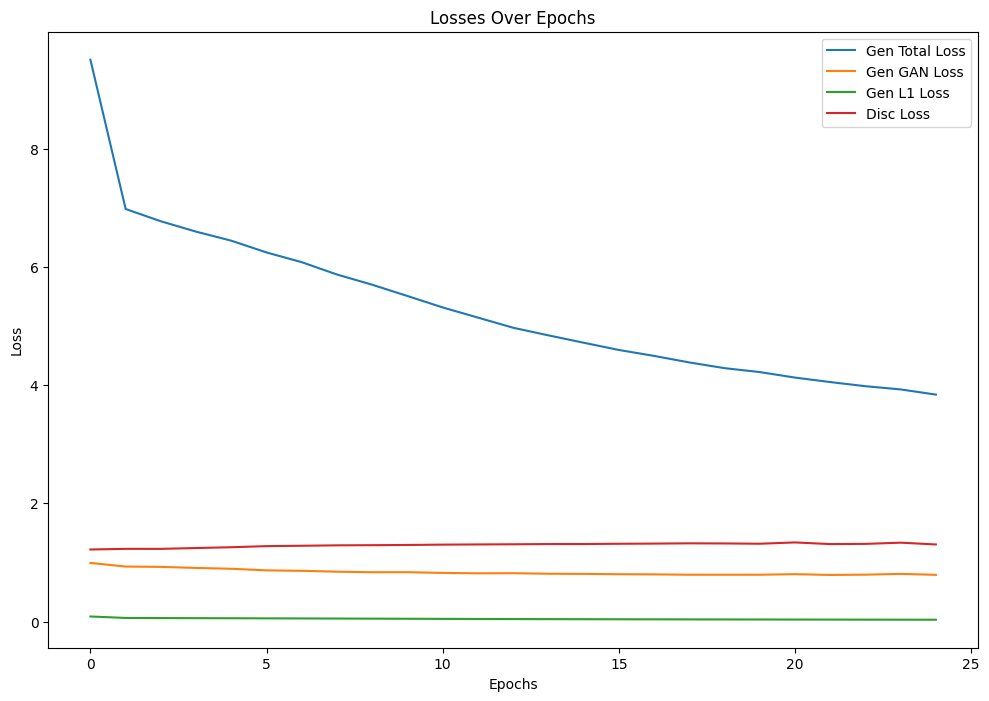

In [18]:
import tensorflow as tf

def train_step(input_image, target, epoch):
    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
        gen_output = generator(input_image, training=True)

        disc_real_output = discriminator([input_image, target], training=True)
        disc_generated_output = discriminator([input_image, gen_output], training=True)

        gen_total_loss, gen_gan_loss, gen_l1_loss = generator_loss(disc_generated_output, gen_output, target)
        disc_loss = discriminator_loss(disc_real_output, disc_generated_output)

    generator_gradients = gen_tape.gradient(gen_total_loss, generator.trainable_variables)
    discriminator_gradients = disc_tape.gradient(disc_loss, discriminator.trainable_variables)

    generator_optimizer.apply_gradients(zip(generator_gradients, generator.trainable_variables))
    discriminator_optimizer.apply_gradients(zip(discriminator_gradients, discriminator.trainable_variables))

    return gen_total_loss, gen_gan_loss, gen_l1_loss, disc_loss

# Make sure to redefine generator_optimizer and discriminator_optimizer variables

# Example usage of fit function
fit(train_dataset, epochs=25, save_weights_path='Pix2PixGan.weights.h5')


In [ ]:
# fit(train_dataset, epochs = 20, save_weights_path='conditionalColorizerPix2PixGan.weights.h5')

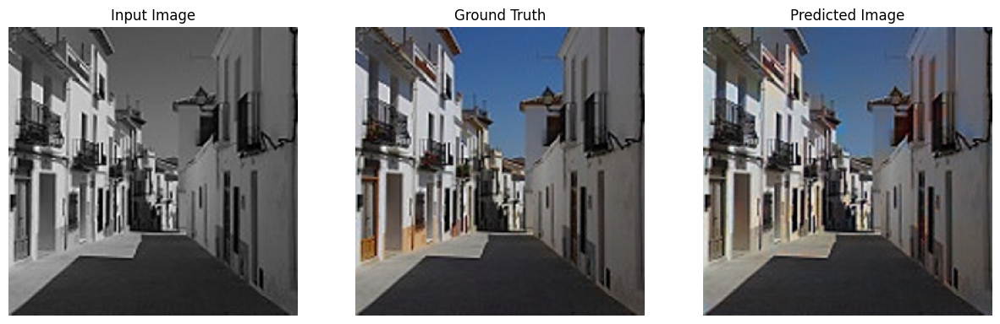

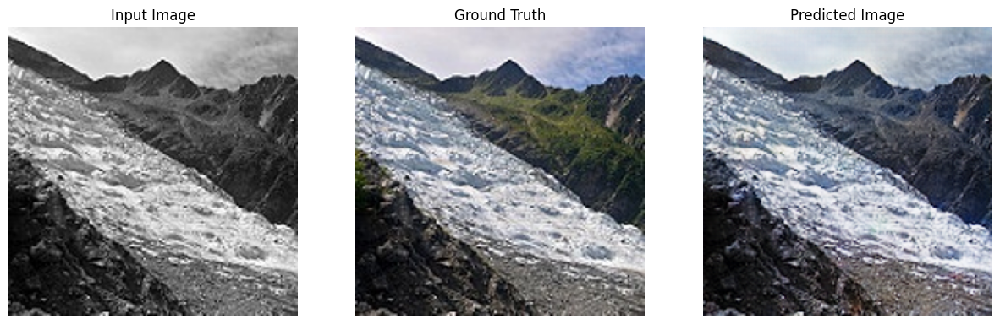

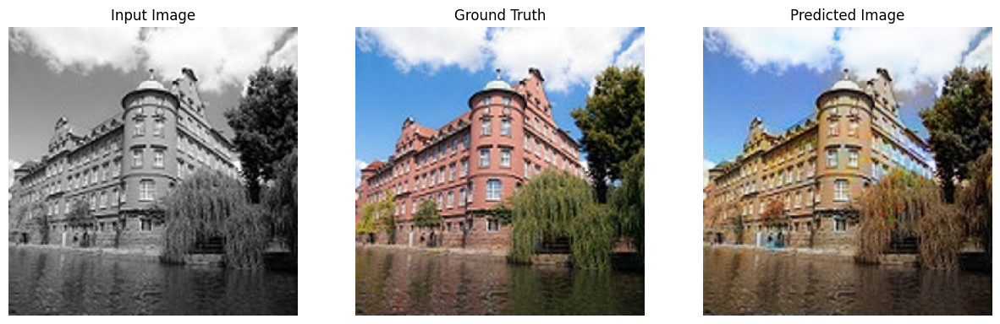

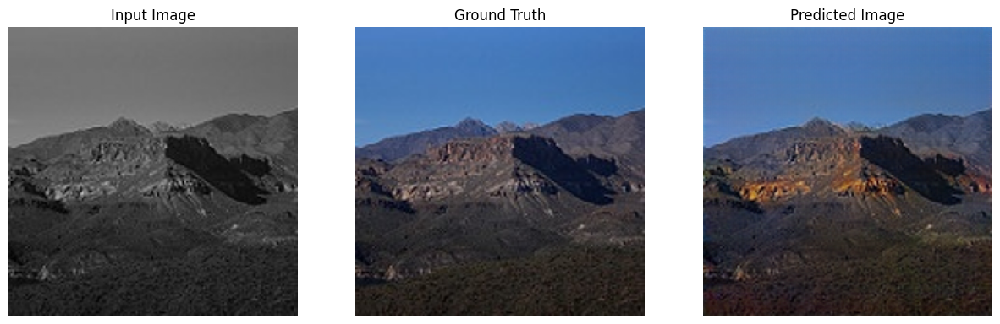

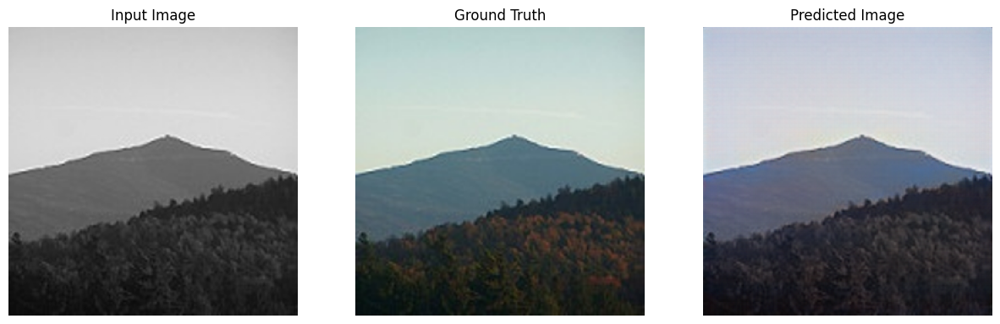

...

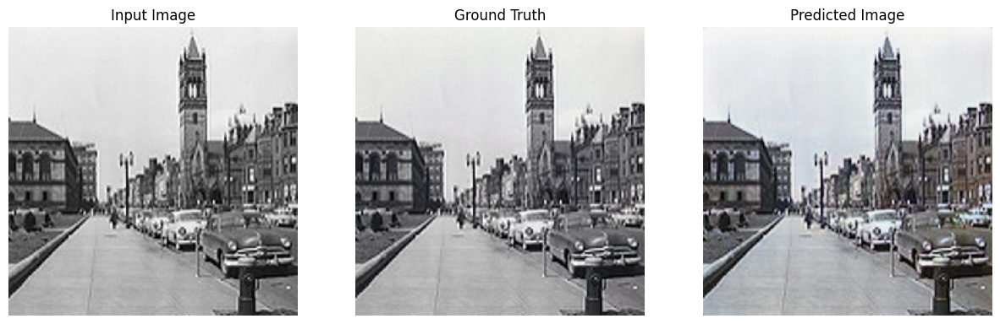

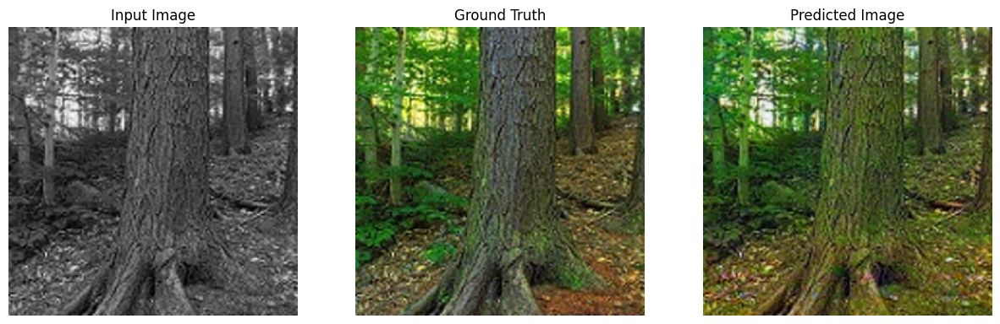

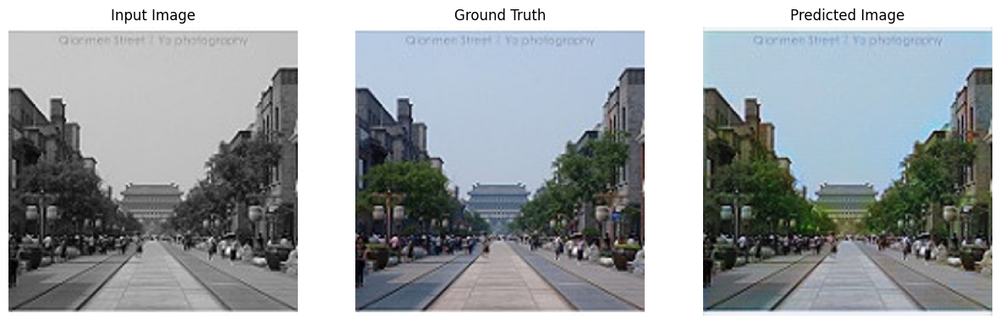

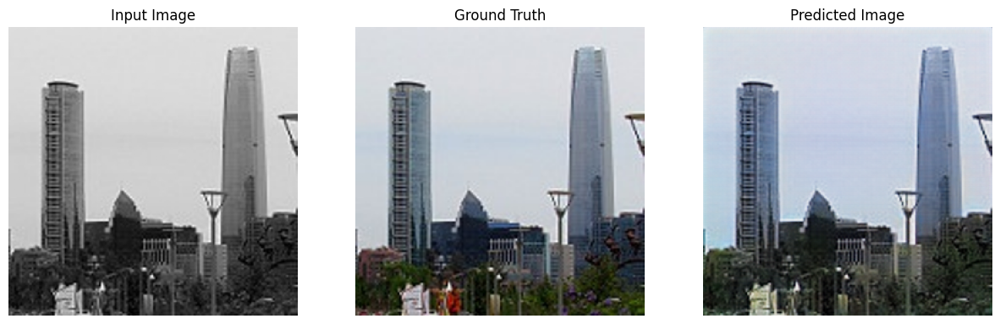

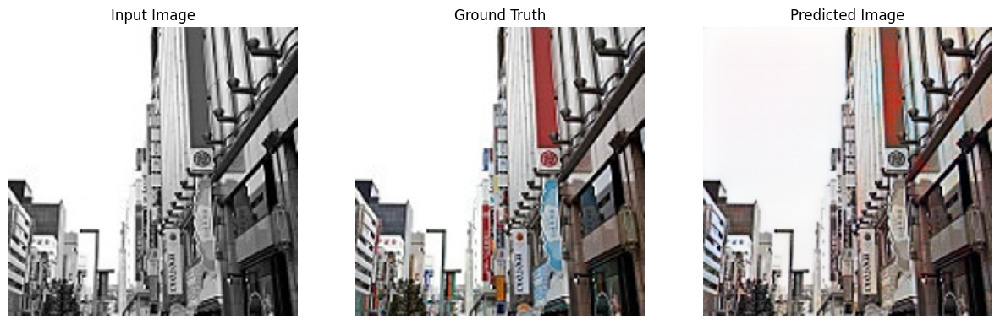

In [19]:
def generate_images(model, test_input, tar):
    prediction = model(test_input, training=True)
    plt.figure(figsize=(15,15))

    display_list = [test_input[0], tar[0], prediction[0]]
    title = ['Input Image', 'Ground Truth', 'Predicted Image']

    for i in range(3):
        plt.subplot(1, 3, i+1)
        plt.title(title[i])
        # getting the pixel values between [0, 1] to plot it.
        plt.imshow(display_list[i])
        plt.axis('off')
    plt.show()

for example_input, example_target in (train_dataset).take(11):
    generate_images(generator, example_input, example_target)

In [20]:
import tensorflow as tf
import numpy as np

# Определение метрик PSNR и SSIM
def compute_psnr(original, generated):
    return tf.image.psnr(original, generated, max_val=255)

def compute_ssim(original, generated):
    return tf.image.ssim(original, generated, max_val=255)

# Функция оценки модели
def evaluate_model(model, dataset):
    psnr_values = []
    ssim_values = []

    for input_image, target in dataset:
        prediction = model(input_image, training=False)
        psnr_value = compute_psnr(target, prediction)
        ssim_value = compute_ssim(target, prediction)

        psnr_values.append(psnr_value.numpy())
        ssim_values.append(ssim_value.numpy())

    avg_psnr = np.mean(psnr_values)
    avg_ssim = np.mean(ssim_values)

    print(f'Average PSNR: {avg_psnr}')
    print(f'Average SSIM: {avg_ssim}')

    return avg_psnr, avg_ssim

# Пример использования функции оценки модели
# Предполагается, что у вас уже есть обученная модель и тестовый набор данных
evaluate_model(generator, val_dataset)


Average PSNR: 71.24430847167969
Average SSIM: 0.9991573095321655


(71.24431, 0.9991573)

In [22]:
pip install lpips-tensorflow

ERROR: Could not find a version that satisfies the requirement lpips-tensorflow (from versions: none)
ERROR: No matching distribution found for lpips-tensorflow
Note: you may need to restart the kernel to use updated packages.


In [35]:
import tensorflow as tf
import numpy as np
from skimage.metrics import structural_similarity as ssim
from skimage.metrics import peak_signal_noise_ratio as psnr

def compute_psnr(original, generated):
    return tf.image.psnr(original, generated, max_val=255)

def compute_ssim(original, generated):
    return tf.image.ssim(original, generated, max_val=255)


# Функция оценки модели
def evaluate_model(model, dataset):
    psnr_values = []
    ssim_values = []


    for input_image, target in dataset:
        prediction = model(input_image, training=False)
        psnr_value = compute_psnr(target, prediction)
        ssim_value = compute_ssim(target, prediction)

        psnr_values.append(psnr_value.numpy())
        ssim_values.append(ssim_value.numpy())


    avg_psnr = np.mean(psnr_values)
    avg_ssim = np.mean(ssim_value)

    
    print(f'Average PSNR: {avg_psnr}')
    print(f'Average SSIM: {avg_ssim}')

    return avg_psnr, avg_ssim

evaluate_model(generator, val_dataset)

Average PSNR: 71.24430847167969
Average SSIM: 0.9991573095321655


(71.24431, 0.9991573)

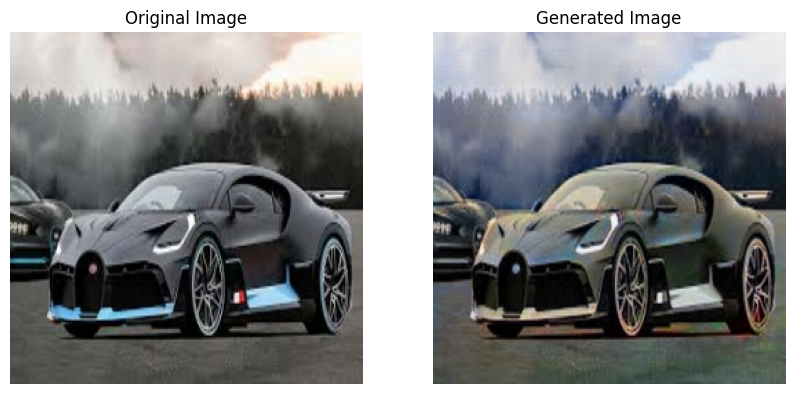

In [37]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt

# Функция для загрузки и предобработки изображения
def load_and_preprocess_image(image_path):
    # Загрузка изображения
    image = tf.io.read_file(image_path)
    image = tf.image.decode_jpeg(image, channels=3)
    # Нормализация значений пикселей к диапазону [0, 1]
    image = tf.image.convert_image_dtype(image, tf.float32)
    # Масштабирование изображения до размера, который ожидает модель
    image = tf.image.resize(image, [256, 256])
    return image

# Функция для отображения изображений
def visualize_images(original, generated):
    plt.figure(figsize=(10, 5))
    plt.subplot(1, 2, 1)
    plt.imshow(original)
    plt.title('Original Image')
    plt.axis('off')
    plt.subplot(1, 2, 2)
    plt.imshow(generated)
    plt.title('Generated Image')
    plt.axis('off')
    plt.show()

# Путь к вашему изображению
image_path = '/kaggle/input/several-images/images (1).jpg'

# Загрузка и предобработка изображения
input_image = load_and_preprocess_image(image_path)
# Добавление измерения батча
input_image = tf.expand_dims(input_image, axis=0)

# Предсказание с использованием вашей модели
prediction = generator(input_image, training=False)
# Извлечение сгенерированного изображения из тензора
generated_image = prediction[0].numpy()

# Визуализация оригинального и сгенерированного изображений
visualize_images(input_image[0], generated_image)


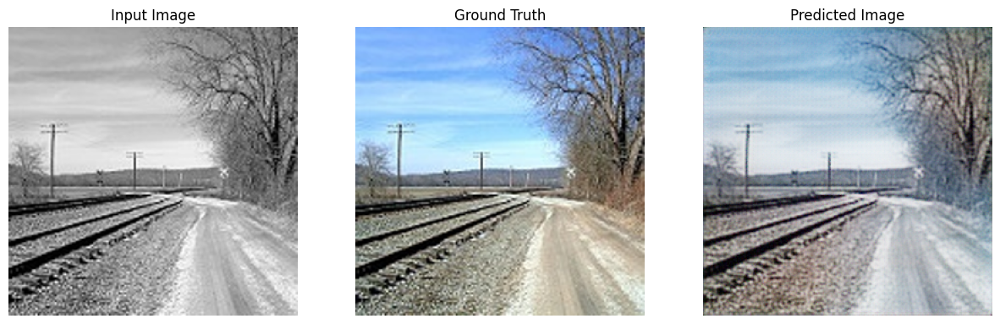

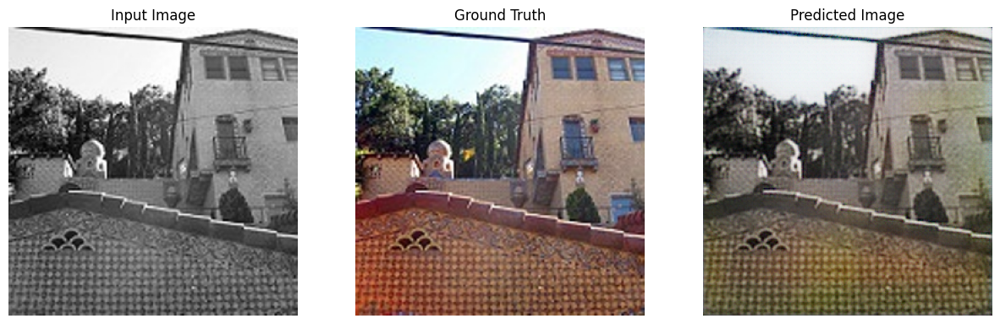

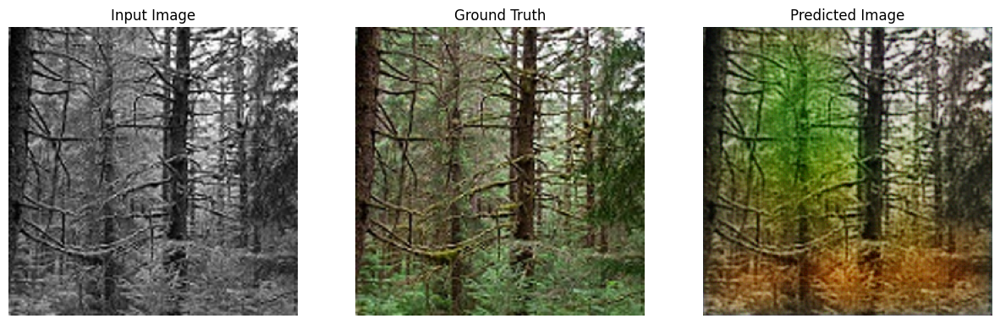

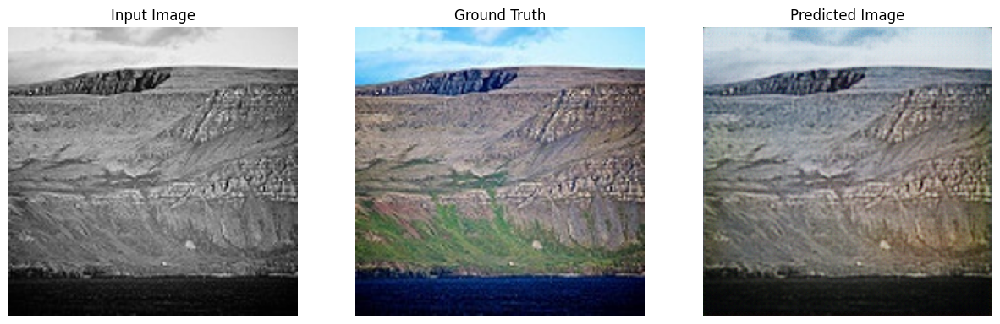

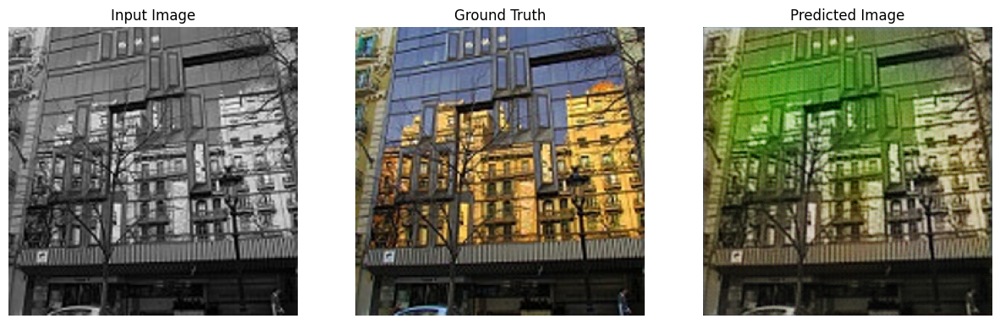

...

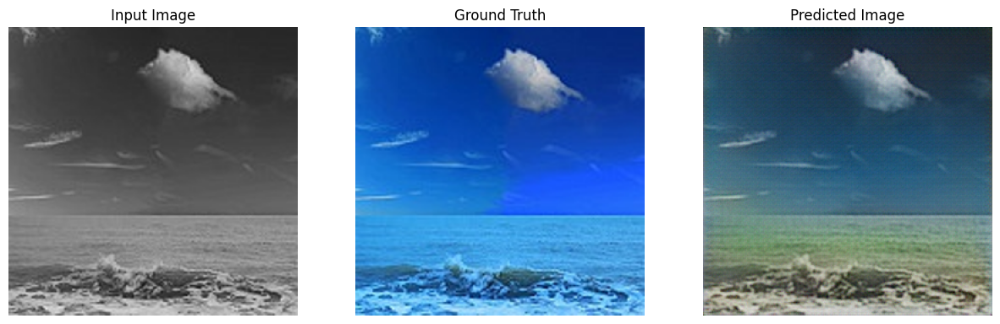

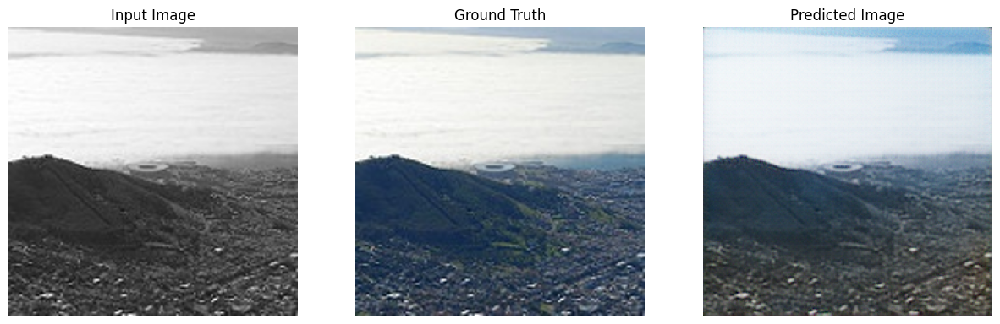

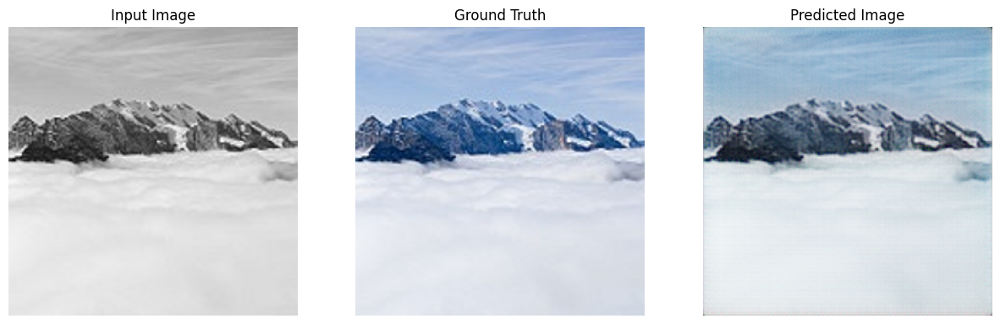

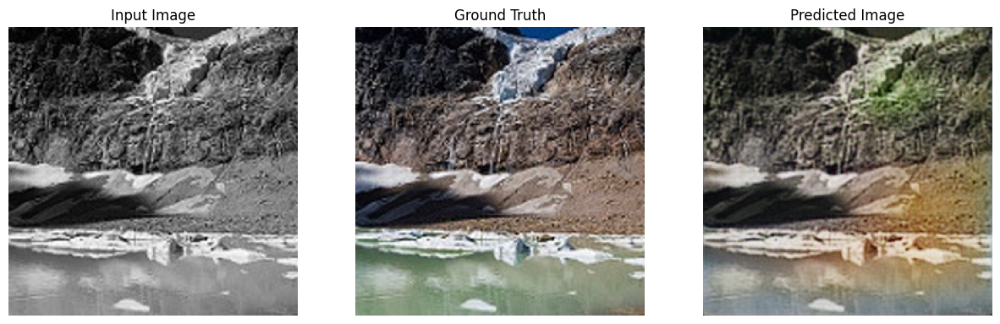

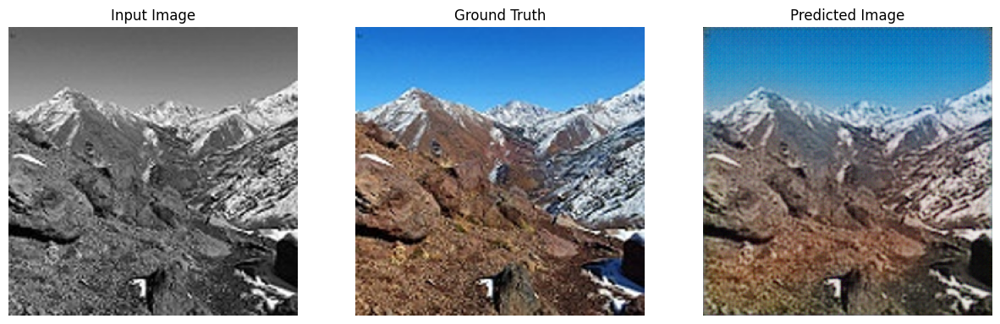

In [58]:
def generate_images(model, test_input, tar):
    prediction = model(test_input, training=True)
    plt.figure(figsize=(15,15))

    display_list = [test_input[0], tar[0], prediction[0]]
    title = ['Input Image', 'Ground Truth', 'Predicted Image']

    for i in range(3):
        plt.subplot(1, 3, i+1)
        plt.title(title[i])
        # getting the pixel values between [0, 1] to plot it.
        plt.imshow(display_list[i])
        plt.axis('off')
    plt.show()

for example_input, example_target in (train_dataset).take(11):
    generate_images(generator, example_input, example_target)

In [26]:
pip freeze >> requirements.txt

Note: you may need to restart the kernel to use updated packages.


In [59]:
import matplotlib.pyplot as plt

def generate_images(model, test_input, tar, file_name):
    prediction = model(test_input, training=True)
    plt.figure(figsize=(15,15))

    display_list = [test_input[0], tar[0], prediction[0]]
    title = ['Input Image', 'Ground Truth', 'Predicted Image']

    for i in range(3):
        plt.subplot(1, 3, i+1)
        plt.title(title[i])
        # getting the pixel values between [0, 1] to plot it.
        plt.imshow(display_list[i])
        plt.axis('off')
    
    plt.savefig(file_name)
    plt.close()

for idx, (example_input, example_target) in enumerate(train_dataset.take(11)):
    file_name = f'generated_image_{idx}.png'
    generate_images(generator, example_input, example_target, file_name)


In [ ]:
# fit(train_dataset, epochs=10, save_weights_path='conditionalColorizerPix2PixGan.weights.h5')
